# TC 5033
## Deep Learning
## Convolutional Neural Networks

#### Members Team #83:
| Student ID | Name |
|------|------------|
| A00378771 | Hiram García Austria |
| A01797374 | David Felipe Hernández Chiapa |
| A01797373 | Gerardo Armando Ávila Velásquez |

#### Activity 2b: Building a CNN for CIFAR10 dataset with PyTorch

- Objective

    The main goal of this activity is to further your understanding of Convolutional Neural Networks (CNNs) by building one using PyTorch. You will apply this architecture to the famous CIFAR10 dataset, taking what you've learned from the guide code that replicated the Fully Connected model in PyTorch (Activity 2a).

- Instructions
    This activity requires submission in teams of 5 or 6 members. Submissions from smaller or larger teams will not be accepted unless prior approval has been granted (only due to exceptional circumstances). While teamwork is encouraged, each member is expected to contribute individually to the assignment. The final submission should feature the best arguments and solutions from each team member. Only one person per team needs to submit the completed work, but it is imperative that the names of all team members are listed in a Markdown cell at the very beginning of the notebook (either the first or second cell). Failure to include all team member names will result in the grade being awarded solely to the individual who submitted the assignment, with zero points given to other team members (no exceptions will be made to this rule).

    Understand the Guide Code: Review the guide code from Activity 2a that implemented a Fully Connected model in PyTorch. Note how PyTorch makes it easier to implement neural networks.

    Familiarize Yourself with CNNs: Take some time to understand their architecture and the rationale behind using convolutional layers.

    Prepare the Dataset: Use PyTorch's DataLoader to manage the dataset. Make sure the data is appropriately preprocessed for a CNN.

    Design the CNN Architecture: Create a new architecture that incorporates convolutional layers. Use PyTorch modules like nn.Conv2d, nn.MaxPool2d, and others to build your network.

    Training Loop and Backpropagation: Implement the training loop, leveraging PyTorch’s autograd for backpropagation. Keep track of relevant performance metrics.

    Analyze and Document: Use Markdown cells to explain your architectural decisions, performance results, and any challenges you faced. Compare this model with your previous Fully Connected model in terms of performance and efficiency.

- Evaluation Criteria

    - Understanding of CNN architecture and its application to the CIFAR10 dataset
    - Code Readability and Comments
    - Appropriateness and efficiency of the chosen CNN architecture
    - Correct implementation of Traning Loop and Accuracy Function
    - Model's performance metrics on the CIFAR10 dataset (at least 65% accuracy)
    - Quality of Markdown documentation

- Submission

Submit via Canvas your Jupyter Notebook with the CNN implemented in PyTorch. Your submission should include well-commented code and Markdown cells that provide a comprehensive view of your design decisions, performance metrics, and learnings.

In [ ]:
# Importamos las librerías necesarias para el proyecto
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torch.utils.data import sampler
import torchvision.datasets as datasets
import torchvision.transforms as T
import matplotlib.pyplot as plt

### Download Cifar10 dataset

In [ ]:
# Verificamos si tenemos acceso a una GPU con CUDA
torch.cuda.is_available()

False

In [ ]:
# Definimos las constantes para el número de muestras en cada conjunto y el tamaño del minibatch
NUM_TRAIN = 50000
NUM_VAL = 5000
NUM_TEST = 5000
MINIBATCH_SIZE = 64

# Definimos las transformaciones para normalizar los datos de CIFAR-10
transform_cifar = T.Compose([
                T.ToTensor(),
                T.Normalize([0.491, 0.482, 0.447], [0.247, 0.243, 0.261])
            ])

# Cargamos el conjunto de entrenamiento, validación y prueba de CIFAR-10 utilizando DataLoader
cifar10_train = datasets.CIFAR10(root='data', train=True, download=True,
                             transform=transform_cifar)
train_loader = DataLoader(cifar10_train, batch_size=MINIBATCH_SIZE, 
                          sampler=sampler.SubsetRandomSampler(range(NUM_TRAIN)))
#Validation set
cifar10_val = datasets.CIFAR10(root='data', train=False, download=True,
                           transform=transform_cifar)
val_loader = DataLoader(cifar10_val, batch_size=MINIBATCH_SIZE, 
                        sampler=sampler.SubsetRandomSampler(range(NUM_VAL)))
#Test set
cifar10_test = datasets.CIFAR10(root='data', train=False, download=True, 
                            transform=transform_cifar)
test_loader = DataLoader(cifar10_test, batch_size=MINIBATCH_SIZE,
                        sampler=sampler.SubsetRandomSampler(range(NUM_VAL, len(cifar10_test))))

100%|██████████| 170M/170M [00:10<00:00, 15.7MB/s] 


In [ ]:
# Mostramos el dataset de entrenamiento de CIFAR-10
cifar10_train

Dataset CIFAR10
    Number of datapoints: 50000
    Root location: data
    Split: Train
    StandardTransform
Transform: Compose(
               ToTensor()
               Normalize(mean=[0.491, 0.482, 0.447], std=[0.247, 0.243, 0.261])
           )

In [ ]:
# 
train_loader.batch_size

64

In [ ]:
# Mostramos los datos del primer minibatch del conjunto de entrenamiento
for i, (x, y) in enumerate(train_loader):
    print(x, y)

tensor([[[[ 1.9020,  1.6479,  1.8702,  ...,  0.9017,  1.5527,  1.6162],
          [ 1.8702,  1.7114,  1.6321,  ...,  1.3145,  1.4098,  1.3304],
          [ 1.8861,  1.8385,  1.6797,  ...,  1.2351,  1.4733,  1.3145],
          ...,
          [ 1.5844,  1.4574,  0.5524,  ...,  1.1558,  1.3463,  1.5844],
          [ 1.7114,  1.5050,  0.8858,  ...,  1.6003,  1.6321,  1.6321],
          [ 1.6638,  0.9335,  0.8858,  ...,  1.6321,  1.6321,  1.5368]],

         [[ 1.6960,  1.4862,  1.6314,  ...,  0.6793,  1.3409,  1.4216],
          [ 1.5830,  1.4377,  1.4377,  ...,  1.0988,  1.1957,  1.1311],
          [ 1.5991,  1.5507,  1.5346,  ...,  1.0182,  1.2602,  1.1150],
          ...,
          [ 1.4216,  1.3409,  0.3726,  ...,  1.0182,  1.1957,  1.4539],
          [ 1.6314,  1.4539,  0.7438,  ...,  1.5184,  1.5346,  1.5669],
          [ 1.5830,  0.8891,  0.7277,  ...,  1.5507,  1.5507,  1.4700]],

         [[ 1.3675,  1.2924,  1.4276,  ...,  0.5862,  1.2924,  1.3976],
          [ 1.3375,  1.0520,  

### Using  GPUs

In [ ]:
# Verificamos el dispositivo disponible para el entrenamiento (GPU o CPU)
if torch.cuda.is_available():
    device = torch.device('cuda')
else:
    device = torch.device('cpu')
print(device)

cpu


### Mostrar imágenes

La imagen muestreada representa un: ship


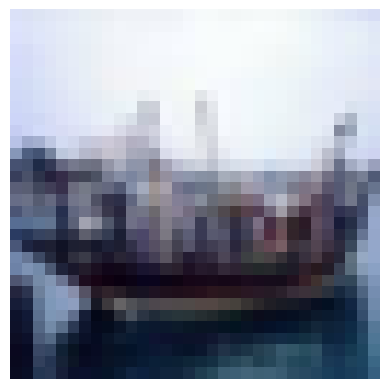

In [ ]:
# Mostramos el dataset de prueba de CIFAR-10
classes = test_loader.dataset.classes

# Función para mostrar una imagen del dataset
def plot_figure(image):
    plt.imshow(np.transpose(image,(1,2,0)))
    plt.axis('off')
    plt.show()

# Muestreamos una imagen aleatoria del conjunto de prueba y mostramos su etiqueta
rnd_sample_idx = np.random.randint(len(test_loader))
print(f'La imagen muestreada representa un: {classes[test_loader.dataset[rnd_sample_idx][1]]}')
image = test_loader.dataset[rnd_sample_idx][0]
image = (image - image.min()) / (image.max() -image.min() )
plot_figure(image)


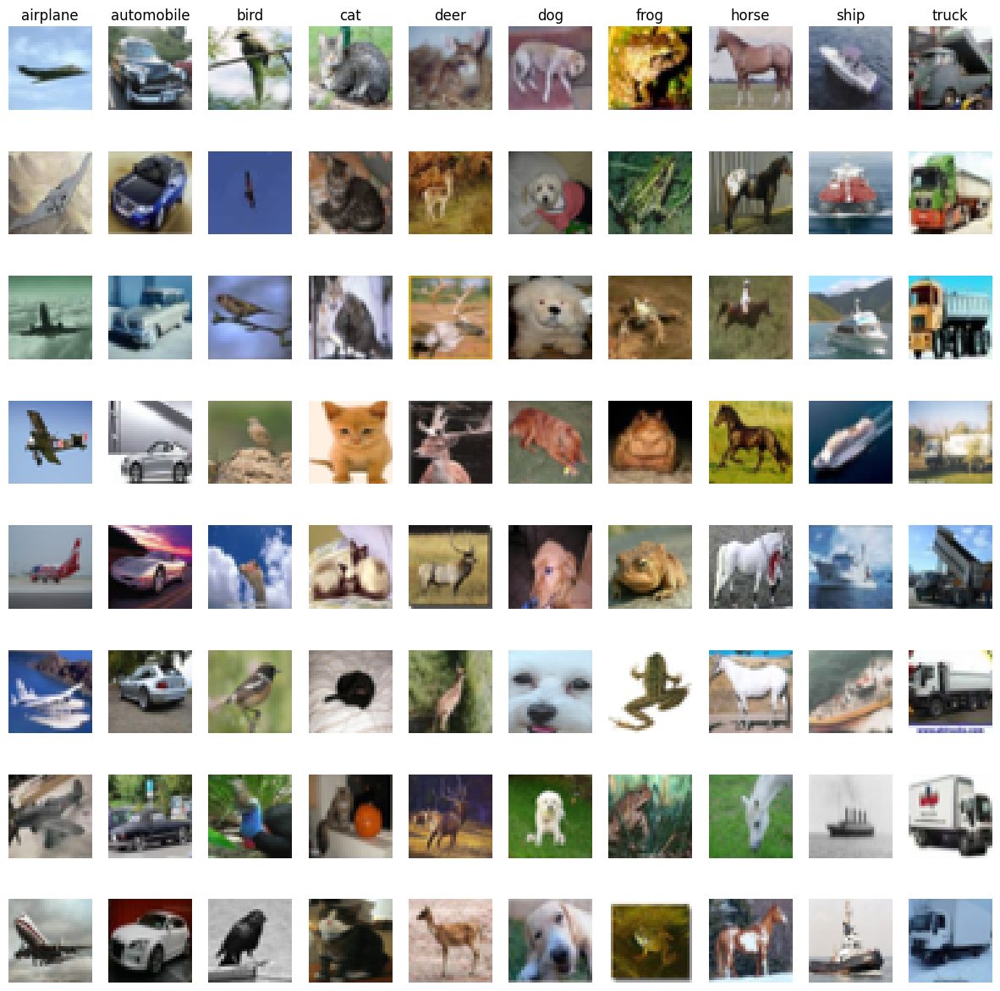

In [ ]:
# Función para mostrar una cuadrícula de imágenes del conjunto de prueba de CIFAR-10
def plot_cifar10_grid():
    classes = test_loader.dataset.classes
    total_samples = 8
    plt.figure(figsize=(15,15))
    for label, sample in enumerate(classes):
        class_idxs = np.flatnonzero(label == np.array(test_loader.dataset.targets))
        sample_idxs = np.random.choice(class_idxs, total_samples, replace = False)
        for i, idx in enumerate(sample_idxs):
            plt_idx = i*len(classes) + label + 1
            plt.subplot(total_samples, len(classes), plt_idx)
            plt.imshow(test_loader.dataset.data[idx])
            plt.axis('off')
            
            if i == 0: plt.title(sample)
    plt.show()

plot_cifar10_grid() 

### Calcular accuracy


In [ ]:
# Función para calcular la precisión del modelo en un conjunto de datos
def accuracy(model, loader):
    correct = 0
    total = 0
    with torch.no_grad():
        for images, labels in loader:
            outputs = model(images)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    return correct / total

### Loop de entrenamiento

In [ ]:
# Función para entrenar el modelo y registrar la precisión en cada epoch
def train(model, optimiser, epochs=100):
    train_acc_history = []
    val_acc_history = []
    for epoch in range(epochs):
        model.train()
        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            optimiser.zero_grad()
            outputs = model(images)
            loss = F.cross_entropy(outputs, labels)
            loss.backward()
            optimiser.step()
        model.eval()
        train_acc = accuracy(model, train_loader)
        val_acc = accuracy(model, val_loader)
        train_acc_history.append(train_acc)
        val_acc_history.append(val_acc)
        print(f'Epoch {epoch+1}/{epochs}, Train Accuracy: {train_acc:.4f}, Val Accuracy: {val_acc:.4f}')
    return train_acc_history, val_acc_history

### Linear model

In [ ]:
# Definimos un modelo lineal simple para la clasificación de CIFAR-10
class LinearModel(nn.Module):
    def __init__(self):
        super(LinearModel, self).__init__()
        self.linear = nn.Linear(3*32*32, 10)
        
    def forward(self, x):
        x = x.view(x.size(0), -1)  # Flatten the input
        return self.linear(x)

In [ ]:
# Usamos PyTorch para crear un modelo lineal para tener un modelo de referencia inicial
model1 = nn.Sequential(
    nn.Flatten(),
    nn.Linear(in_features=3*32*32, out_features=200), 
    nn.Dropout(),
    nn.ReLU(),
    nn.Linear(in_features=200, out_features=10)
)

optimizer = torch.optim.Adam(model1.parameters(), lr=0.001, weight_decay=1e-4)
model1.to(device)
epochs = 10

# Entrenamos el modelo y registramos la precisión en cada epoch
train_acc, val_acc = train(model1, optimizer, epochs=epochs)

Epoch 1/10, Train Accuracy: 0.4274, Val Accuracy: 0.4190
Epoch 2/10, Train Accuracy: 0.4716, Val Accuracy: 0.4752
Epoch 3/10, Train Accuracy: 0.4626, Val Accuracy: 0.4506
Epoch 4/10, Train Accuracy: 0.4861, Val Accuracy: 0.4760
Epoch 5/10, Train Accuracy: 0.4931, Val Accuracy: 0.4750
Epoch 6/10, Train Accuracy: 0.4925, Val Accuracy: 0.4754
Epoch 7/10, Train Accuracy: 0.5020, Val Accuracy: 0.4878
Epoch 8/10, Train Accuracy: 0.4999, Val Accuracy: 0.4706
Epoch 9/10, Train Accuracy: 0.5165, Val Accuracy: 0.4880
Epoch 10/10, Train Accuracy: 0.5202, Val Accuracy: 0.4838


### Sequential CNN

In [ ]:
# Utilizamos PyTorch para crear un modelo de red neuronal convolucional para la clasificación de CIFAR-10
class CNNModel(nn.Module):
    def __init__(self):
        super(CNNModel, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.fc1 = nn.Linear(64 * 8 * 8, 256)
        self.fc2 = nn.Linear(256, 10)
    
    # Esta función define la propagación hacia adelante del modelo
    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = self.pool(x)
        x = F.relu(self.conv2(x))
        x = self.pool(x)
        x = x.view(x.size(0), -1)  # Flatten the input
        x = F.relu(self.fc1(x))
        return self.fc2(x)
    

In [ ]:
# Creamos una instancia del modelo CNN, definimos el optimizador y entrenamos el modelo
model2 = CNNModel()
optimizer2 = torch.optim.Adam(model2.parameters(), lr=0.001, weight_decay=1e-4)
model2.to(device)

# Entrenamos el modelo CNN y registramos la precisión en cada epoch
train_acc_cnn, val_acc_cnn = train(model2, optimizer2, epochs=epochs)

Epoch 1/10, Train Accuracy: 0.6684, Val Accuracy: 0.6510
Epoch 2/10, Train Accuracy: 0.7560, Val Accuracy: 0.7100
Epoch 3/10, Train Accuracy: 0.7993, Val Accuracy: 0.7112
Epoch 4/10, Train Accuracy: 0.8531, Val Accuracy: 0.7366
Epoch 5/10, Train Accuracy: 0.8777, Val Accuracy: 0.7282
Epoch 6/10, Train Accuracy: 0.9295, Val Accuracy: 0.7370
Epoch 7/10, Train Accuracy: 0.9485, Val Accuracy: 0.7290
Epoch 8/10, Train Accuracy: 0.9604, Val Accuracy: 0.7194
Epoch 9/10, Train Accuracy: 0.9561, Val Accuracy: 0.7154
Epoch 10/10, Train Accuracy: 0.9599, Val Accuracy: 0.7052


In [ ]:
# Es hora de evaluar la precisión del modelo CNN en el conjunto de prueba
accuracy(model2, test_loader)

0.7128

In [ ]:
# Función para predecir las etiquetas de un conjunto de datos utilizando el modelo entrenado
def predict(x, model):
    x = x.to(device=device, dtype = torch.float32)
    scores = model(x) # mb_size, 10
    _, pred = scores.max(dim=1) #pred shape (mb_size )
    return pred.cpu().numpy()

La imagen muestreada representa un: horse


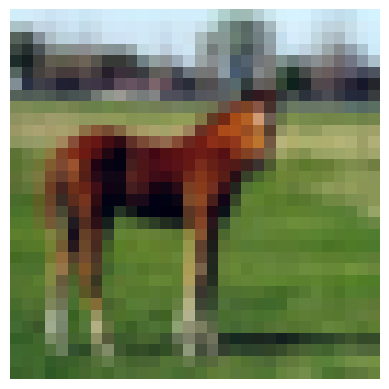

El valor predicho: horse


In [22]:
# Get a random sample from the test set
rnd_idx = np.random.randint(len(test_loader.dataset))
alphabet = classes

print(f'La imagen muestreada representa un: {alphabet[test_loader.dataset[rnd_idx][1]]}')

# Get the image and prediction
image_tensor = test_loader.dataset[rnd_idx][0]
image_to_plot = (image_tensor - image_tensor.min()) / (image_tensor.max() - image_tensor.min())
plot_figure(image_to_plot)

# Make prediction
pred = predict(image_tensor.unsqueeze(0), model2)
print(f'El valor predicho: {alphabet[pred[0]]}')

## Conclusiones generales:
- El modelo lineal simple proporciona una línea base inicial para la clasificación de CIFAR-10, su precisión (48.8%) es muy baja debido a su incapacidad para capturar las complejidades de las imágenes.

- El modelo CNN mejora significativamente la precisión en comparación con el modelo lineal (73.7%), demostrando la efectividad de las redes convolucionales para tareas de visión por computadora.

- El modelo CNN es capaz de aprender características espaciales de las imágenes, lo que le permite clasificar correctamente las imágenes del conjunto de prueba con una precisión mucho mejor que el modelo lineal.